# Lending Club Data Analysis - Lab 3

Brady Arendale, Aaron Cattley, John Partee

# Business Understanding 1

LendingClub is a company which allows consumers to underwrite loans, investing with as little as $25 per loan. Loans can vary in interest rate based on the risk associated with the loan. This allows consumers to back other consumer's loans, accepting risk, but making (most of) the interest a bank would normally make if it is repaid. The data we are analyzing is collected when consumers apply for loans to better inform potential investors on the risks associated with the loan. 

We will apply clustering methods to our data for customer segmentation. This will allow potential investors to get a broad overview of the type of applicant they are looking at before diving into the details. Investors will be able to skim over clusters that generally produce more defaults than average, while examining less risky clusters more deeply.

Clusters can also be used by LendingClub themselves for marketing and customer service purposes. The marketing group has a limited budget for marketing their loans, so we want to utilize their existing customer base for market segmentation based on location, income, FICO score, etc.  We'll build our clustering algorithms with these goals in mind in hopes to identify the best areas and/or groups to target for marketing.

To determine the effectiveness of our clustering algorithms, we will use silhouette score. This metric weights both intra-cluster distance and distance to the nearest cluster, and is a popular measurement for clustering quality when ground truth is not known. We will balance this against number of clusters, preferring somewhere around 3-15 for interpretability, and cluster spread, so our model is not dominated by one or two clusters with some clusters only being a few observations each. We will take all these measures holistically to subjectively determine the most appropriate clustering.

# Data Understanding 1

## Setup

In [1]:
#setup block
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
#read in the data
df = pd.read_csv('LoanStats_securev1_2019Q2.csv')

#As 150 variables is a little more than we want or need, we pared it down to these 20 variables, with loan_status as the response:
df = df[['loan_amnt', 'term', 'int_rate',
          'sub_grade', 'purpose', 'emp_length',
          'home_ownership', 'annual_inc',
          'verification_status', 'addr_state', 'dti',
          'earliest_cr_line', 'fico_range_low', 'inq_last_6mths',
          'open_acc', 'pub_rec', 'revol_bal',
          'application_type', 'loan_status']]

#narrow it down to single applications, not joint, and drop application type
df = df.loc[df['application_type'] == 'Individual']
df = df.drop(columns = ['application_type'])

#make the emp_length numerical
df['emp_length'] = df['emp_length'].fillna('0').str.extract('(\d+)').astype(int)

#Make int_rate numerical
df['int_rate'] = df['int_rate'].str.extract('(\d+)').astype(float)

#Make inq_last_6mths an integer
df['inq_last_6mths'] = df['inq_last_6mths'].astype(int)

#Make open_acc an integer
df['open_acc'] = df['open_acc'].astype(int)

#Make pub_rec an integer
df['pub_rec'] = df['pub_rec'].astype(int)

#Some light feature engineering for earliest_cr_line, which is not a factor, but a descrete variable. 
from datetime import datetime
def timeFromJun19(date):
  date = datetime.strptime(date, '%b-%Y')
  return (2019 - date.year)*12 + 6 - date.month

df['earliest_cr_line'] = df['earliest_cr_line'].apply(timeFromJun19)

#Lastly, we're going to consolidate the 'good' and 'bad' loan labels into two groups- We want to get paid,
#so the degree of lateness is irrelevant! 
df = df.replace(['Charged Off', 'Late (16-30 days)', 'Late (31-120 days)', 'In Grace Period'],
                "Late or Unpaid")
df = df.replace(['Current', 'Fully Paid'],
                'Current or Fully Paid')

#Roll up sub grade to simplify dummy variables
df['letter_grade'] = [i[0] for i in df['sub_grade']]

#Remove sub grade
del df['sub_grade']

In [3]:
df.info()
print("\nDuplicated records: ")
df.duplicated().value_counts()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 111863 entries, 0 to 131138
Data columns (total 19 columns):
Unnamed: 0             111863 non-null int64
loan_amnt              111863 non-null float64
term                   111863 non-null object
int_rate               111863 non-null float64
purpose                111863 non-null object
emp_length             111863 non-null int64
home_ownership         111863 non-null object
annual_inc             111863 non-null float64
verification_status    111863 non-null object
addr_state             111863 non-null object
dti                    111863 non-null float64
earliest_cr_line       111863 non-null int64
fico_range_low         111863 non-null float64
inq_last_6mths         111863 non-null int64
open_acc               111863 non-null int64
pub_rec                111863 non-null int64
revol_bal              111863 non-null float64
loan_status            111863 non-null object
letter_grade           111863 non-null object
dtypes: float64

False    111863
dtype: int64

In [4]:
df = df.drop([col for col in df.columns if col.startswith('Unnamed')], axis=1)

The original data is 131,141 rows of 150 columns, which we reduced to these 18 chosen attributes by intuition. This downselection left us with 18 columns (17 explanatory variables), and 111,863 rows. The reduction made sense for reuse of this data for clustering.

## Data definitions
- **loan_amnt** is the requested (and funded) amount of the loan in US dollars with a range of 1000 to 40000. Note that these are all funded loans. 
- **term** is the length of the loan, 36 or 60 months. This is categorical object intentionally as it is not continuous.
- **int_rate** is the interest rate of the loan as a float.
- **sub_grade** is the letter 'grade' of the loan, with an additional numerical sub grade. This is a proxy for assessed risk, and is directly related to the interest rate. This is a categorical object.
- **purpose** is the categorical stated purpose of the loan applied for, as an object. 
- **emp_length** is the length of time in years the applicant has been at their current job. 0 represents someone who is unemployed. This is an integer.
- **home_ownership** describes whether an applicant owns, rents, or mortgages their home. This is a categorical object.
- **annual_inc** is the applicant's pre-tax annual income in US dollars, as a float.
- **verification_status** indicates whether LendingClub has verified the applicant's annual income, as a categorical object.
- **addr_state** is the state in which the applicant lives, as a categorical object.
- **dti** is the applicant's debt to income ratio, if the loan is granted, as a float.
- **earliest_cr_line** is the number of months from June 2019 from when the applicant's first line of credit was extended, as an integer.
- **fico_range_low** is the low end of the FICO score when credit was pulled, as a float.
- **inq_last_6mths** is the number of credit inquiries in the applicant's credit report in the last six months, as an integer.
- **open_acc** is the number of credit accounts the applicant has open, both revolving and installment, as an integer.
- **pub_rec** is the number of adverse public records against an applicant (Tax liens, judgements, collections), as an integer.
- **revol_bal** is the applicant's revolving debt balance (credit card debt), as a float.
- **loan_status** indicates the status of the loan, which has been generalized to either "Late or Unpaid" and "Current or Fully Paid", as a categorical object.

## Outlier detection

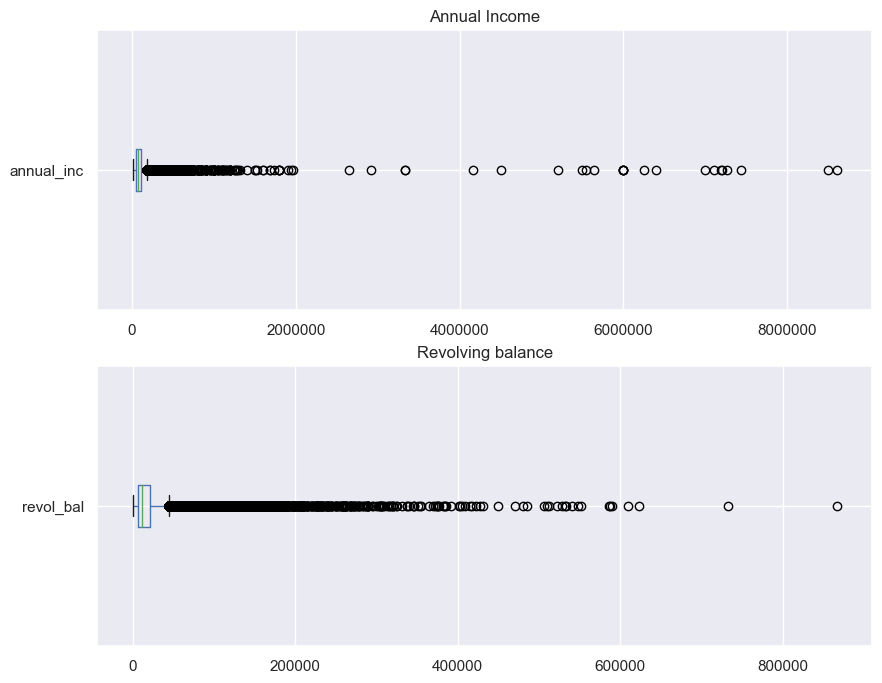

In [5]:
import seaborn as sns
plt.style.use('default') # makes the size nice
sns.set()
fig, (ax0, ax1) = plt.subplots(2,1, figsize=(10,8))

#Annual income
df.annual_inc.plot(kind='box', vert=False, ax=ax0)
ax0.set_title('Annual Income')

#Revolving balance
df.revol_bal.plot(kind='box', vert=False, ax=ax1)
ax1.set_title('Revolving balance')
plt.show()

Our data contains outliers as shown in the above graphs for annual income and revolving balance. We believe these are valid data and not input errors or some other kind of mistake. We will account for these by standardizing all columns.

# Data Understanding 2

### Loan status

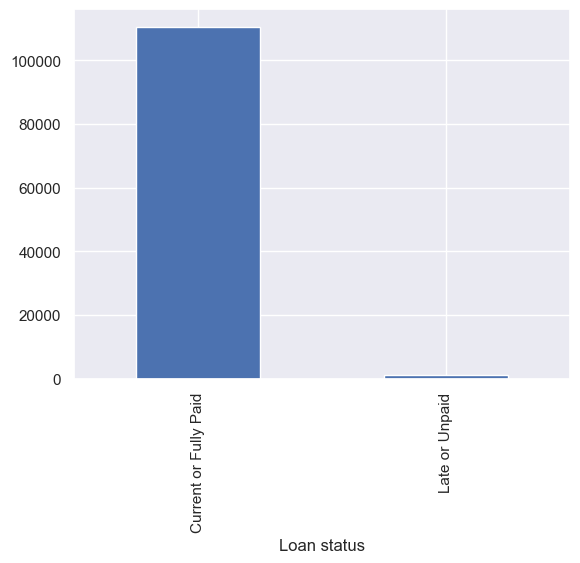

In [6]:
df.loan_status.value_counts().plot(kind='bar')
plt.xlabel('Loan status')
plt.show()

In [7]:
df.loan_status.value_counts(normalize=True)

Current or Fully Paid    0.987726
Late or Unpaid           0.012274
Name: loan_status, dtype: float64

A very small percentage of loans in the dataset are defaults, just over 1 percent.

### Loan amount

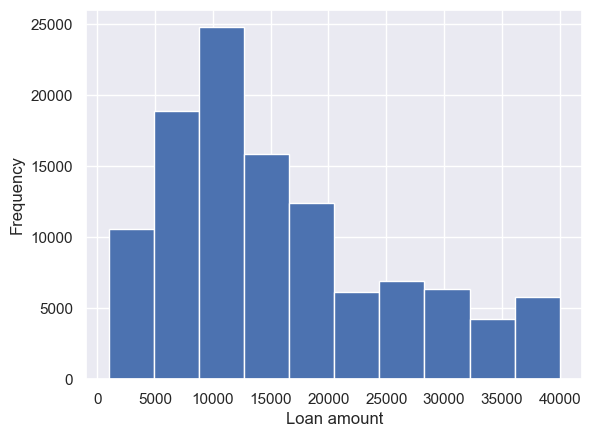

In [8]:
df.loan_amnt.plot(kind='hist')
plt.xlabel('Loan amount')
plt.show()

Loan amount is right skewed, with the most common values being between \\$10000 and \\$15000.

### Loan term

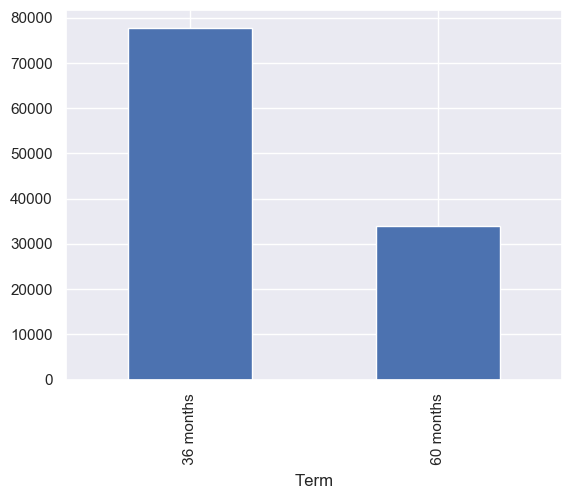

In [9]:
df.term.value_counts().plot(kind='bar')
plt.xlabel('Term')
plt.show()

A bit over twice as many loans are 36-month term loans than 60-month terms.

### Interest rate

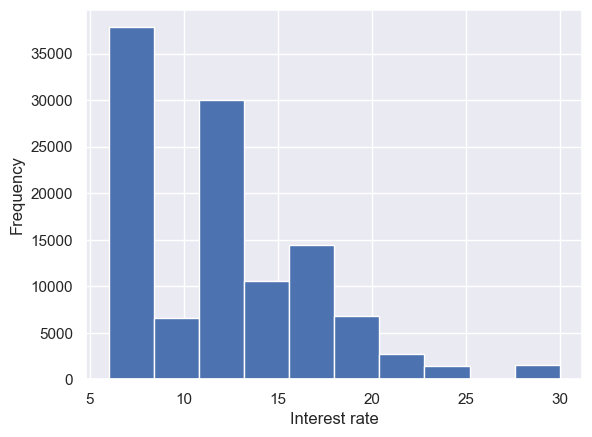

In [10]:
df.int_rate.plot(kind='hist')
plt.xlabel('Interest rate')
plt.show()

Interest rate sees some spikes around 5 to 10 percent. These are likely to be loans graded A and B, which are the most common grades on LendingClub. These loans are typically safer for the investor, but yield less potential ROI.

### Loan purpose

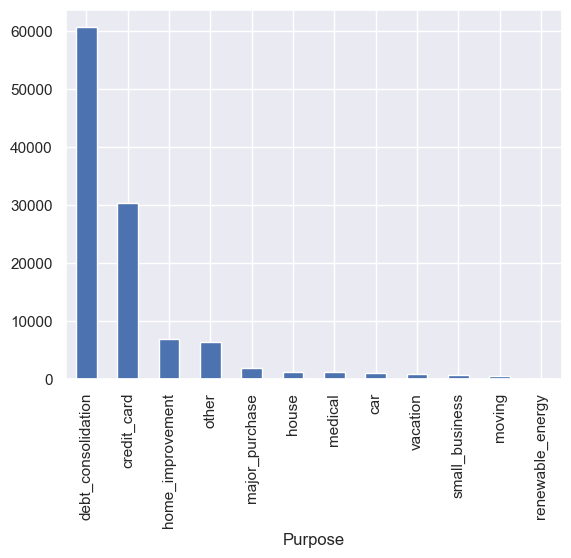

In [11]:
df.purpose.value_counts().plot(kind='bar')
plt.xlabel('Purpose')
plt.show()

A large majority of LendingClub applications are for the related purposes of debt consolidation and credit cards. Few applications are for productive tasks or purchases like home improvement and small businesses.

### Employment length

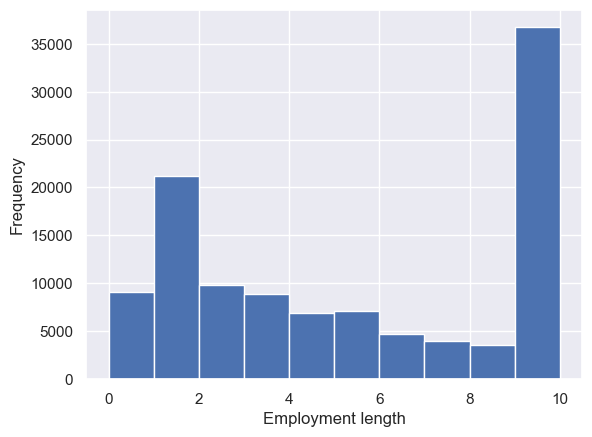

In [12]:
df.emp_length.plot(kind='hist')
plt.xlabel('Employment length')
plt.show()

Employment length is bimodal, with a small peak at 1 year and a sharp spike at 10 years. This shows varying backgrounds that LendingClub applicants come from, from those who have worked at one place for many years to those just starting their professional careers or changing jobs.

### Annual income

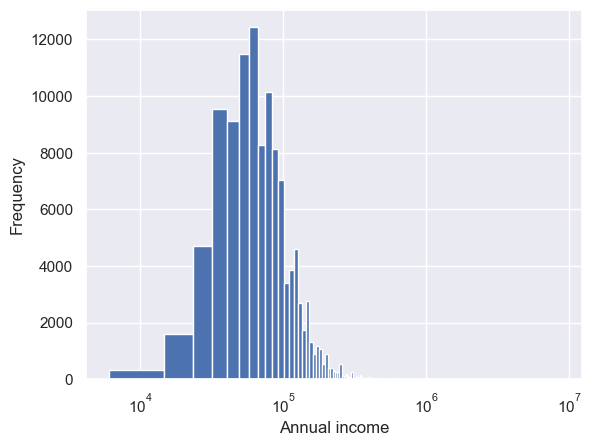

In [13]:
df.annual_inc.plot(kind='hist', bins=1000, logx=True)
plt.xscale('log')
plt.xlabel('Annual income')
plt.show()

Income is severely right skewed as seen before. We have values ranging from around \\$10,000 all the way up to \\$10 million. The log transformation is more bell-shaped.

### State

In [71]:
import plotly.express as px
import plotly.io as pio
pio.renderers.default = 'notebook'
states = pd.DataFrame(df.addr_state.value_counts()).reset_index()
px.choropleth(states, color="addr_state", locations='index', locationmode="USA-states", scope="usa", 
                  color_continuous_scale=px.colors.carto.Burg, labels={'addr_state':'Applicants'})

The number of applications in a state corresponds pretty strongly to the state's population. As we might expect, the top states for LendingClub applicants are California, Texas, Florida, and New York.

### Debt-to-income ratio

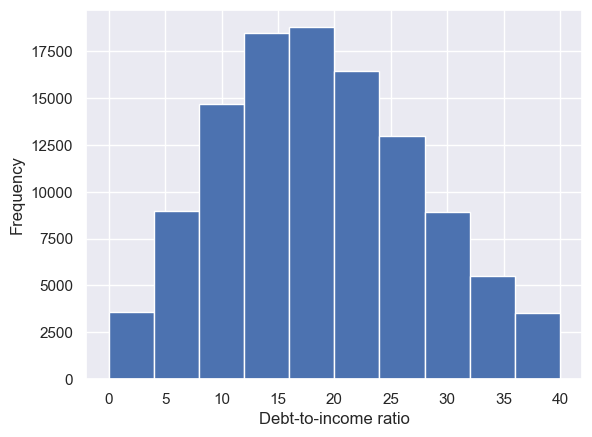

In [15]:
df.dti.plot(kind='hist')
plt.xlabel('Debt-to-income ratio')
plt.show()

Debt-to-income ratio is very normally distributed. Most applicants have a DTI ratio between 15 and 20.

### FICO score

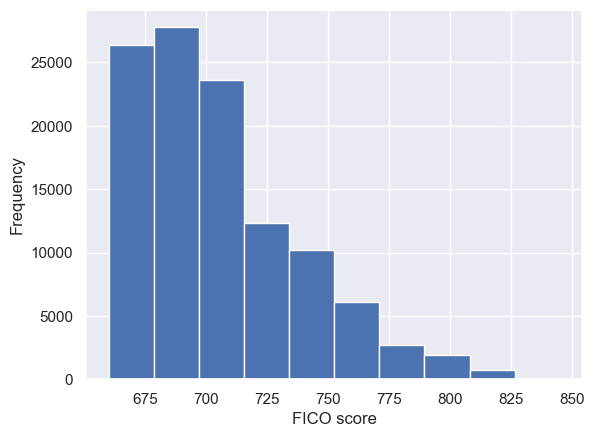

In [16]:
df.fico_range_low.plot(kind='hist')
plt.xlabel('FICO score')
plt.show()

As we discussed in a previous lab, the range of FICO scores for LendingClub applicants is much higher than the population as a whole, with the whole range of 300-660 not represented. The mean FICO score, however, is right in line with the nation average of 706.

### Loan grade

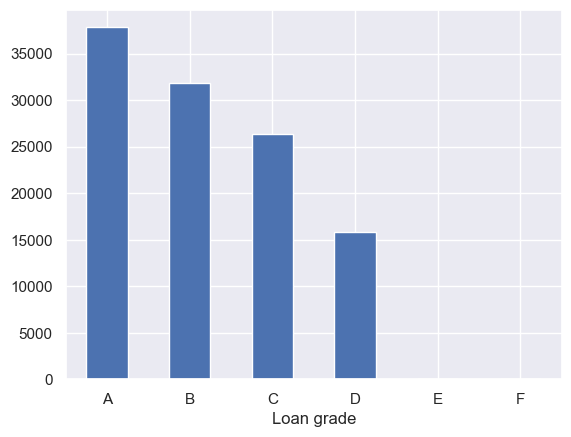

In [17]:
df.letter_grade.value_counts().plot(kind='bar', rot=0)
plt.xlabel('Loan grade')
plt.show()

The majority of applications are assigned a grade of A or B, signifying low risk. Grades C and D also make up a large chunk of applications. Grades of E and F, only assigned to the loans deemed most risky, are rarely given out.

# Modeling and Evaluation 1

We will be using k-means, mini-batch k-means, and DBSCAN to cluster our dataset. These algorithms were chosen for their scalability and performance. We tried other algorithms including spectral clustering and hierarchical agglomerative clustering, but memory and runtime were an issue.

## Setup

In [18]:
df_numeric = df.loc[:,df.dtypes!=object]
df_numeric.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 111863 entries, 0 to 131138
Data columns (total 11 columns):
loan_amnt           111863 non-null float64
int_rate            111863 non-null float64
emp_length          111863 non-null int64
annual_inc          111863 non-null float64
dti                 111863 non-null float64
earliest_cr_line    111863 non-null int64
fico_range_low      111863 non-null float64
inq_last_6mths      111863 non-null int64
open_acc            111863 non-null int64
pub_rec             111863 non-null int64
revol_bal           111863 non-null float64
dtypes: float64(6), int64(5)
memory usage: 10.2 MB


In [19]:
from sklearn.preprocessing import StandardScaler
X_num = StandardScaler().fit_transform(df_numeric)

## K-means

We'll use the elbow method on inertia to find a range of good k values, and then use the silhouette score to choose the most optimal clustering.

In [20]:
from sklearn.cluster import KMeans
#Run k-means for k values 1 to 20 and calculate inertias
k_values = range(1,21)
inertias = []
for k in k_values:
    km_model = KMeans(n_clusters=k)
    km_model.fit(X_num)
    inertias.append(km_model.inertia_)

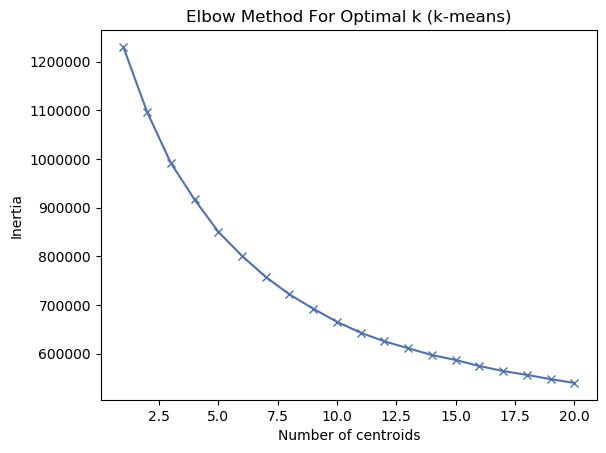

In [21]:
plt.style.use('default')
plt.plot(k_values, inertias, 'bx-')
plt.xlabel('Number of centroids')
plt.ylabel('Inertia')
plt.title('Elbow Method For Optimal k (k-means)')
plt.show()

In [22]:
#Run mini-batch k-means for k values 1 to 29 and calculate inertia
from sklearn.cluster import MiniBatchKMeans
mb_kvalues = range(1,30)
mb_inertias = []
for k in mb_kvalues:
    mbkm_model = MiniBatchKMeans(n_clusters=k, random_state=9001, n_init=100)
    mbkm_model.fit(X_num)
    mb_inertias.append(mbkm_model.inertia_)

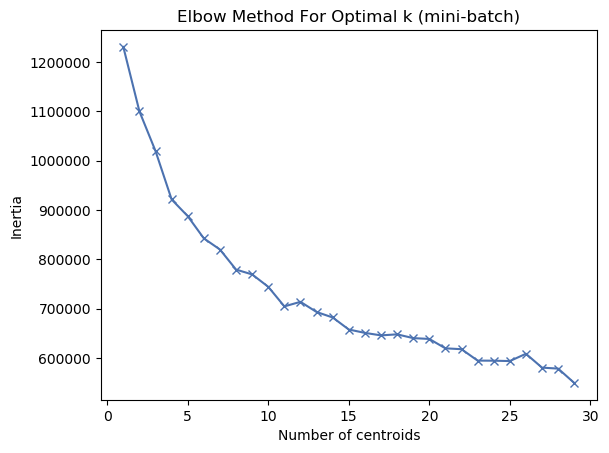

In [23]:
plt.plot(mb_kvalues, mb_inertias, 'bx-')
plt.xlabel('Number of centroids')
plt.ylabel('Inertia')
plt.title('Elbow Method For Optimal k (mini-batch)')
plt.show()

We will calculate silhouette scores for k values of 4 to 9 for standard k-means and 3 to 11 for mini-batch k-means.

In [24]:
#Calculate silhouette scores for chosen k values for k-means
from sklearn.metrics import silhouette_score
km_kvalues = range(4,10)
km_silhouettes = []
for k in km_kvalues:
    km_model = KMeans(n_clusters=k, random_state=9001)
    km_model.fit(X_num)
    km_silhouettes.append(silhouette_score(X_num, km_model.labels_))

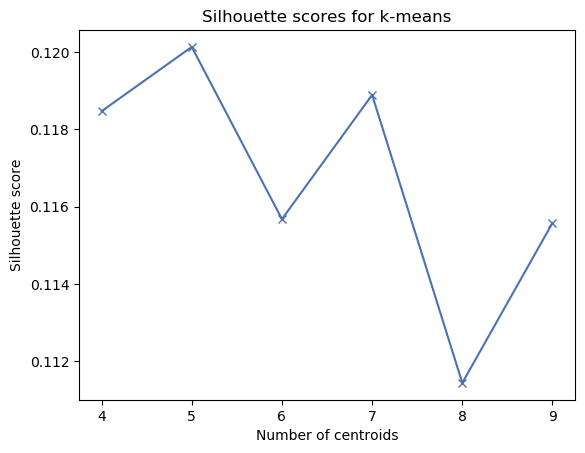

In [25]:
plt.plot(km_kvalues, km_silhouettes, 'bx-')
plt.xlabel('Number of centroids')
plt.ylabel('Silhouette score')
plt.title('Silhouette scores for k-means')
plt.show()

In [26]:
#Calculate silhouette scores for chosen k values for mini-batch k-means
mb_kvalues = range(3,12)
mb_silhouettes = []
for k in mb_kvalues:
    mbkm_model = MiniBatchKMeans(n_clusters=k, random_state=9001, n_init=100)
    mbkm_model.fit(X_num)
    mb_silhouettes.append(silhouette_score(X_num, mbkm_model.labels_))

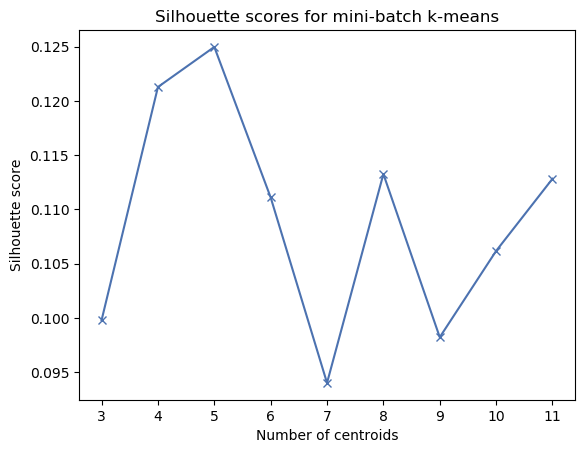

In [27]:
plt.plot(range(3,12), mb_silhouettes, 'bx-')
plt.xlabel('Number of centroids')
plt.ylabel('Silhouette score')
plt.title('Silhouette scores for mini-batch k-means')
plt.show()

## Scoring k-means models

We'll go with 5 for both standard k-means mini-batch k-means as our chosen models according to the graphs above.

In [28]:
km_model = KMeans(n_clusters=5, random_state=9001, n_jobs=-1)
print('Training time:')
%time km_model.fit(X_num)
print('Inertia for k-means:', km_model.inertia_, '\nSilhouette score for k-means:', 
      silhouette_score(X_num, km_model.labels_))

Training time:
Wall time: 5.39 s
Inertia for k-means: 850903.1041121692 
Silhouette score for k-means: 0.12011422992527443


In [29]:
mb_model = MiniBatchKMeans(n_clusters=5, random_state=9001, n_init=100)
print('Training time:')
%time mb_model.fit(X_num)
mb_sil_score = silhouette_score(X_num, mb_model.labels_)
print('Inertia for mini batch k-means:', mb_model.inertia_, '\nSilhouette score for mini batch k-means:', mb_sil_score)

Training time:
Wall time: 555 ms
Inertia for mini batch k-means: 887544.2025661329 
Silhouette score for mini batch k-means: 0.12497143371495148


## DBSCAN

We will build k-neighbor graphs for k values of 4, 10, 20, and 30. We will look for the elbow on each graph to determine the appropriate value of eps to use for each k value.

In [31]:
#Create k-neighbors graphs for 4, 10, 20, and 30 neighbors
from sklearn.neighbors import kneighbors_graph
%time db_neighbors4 = kneighbors_graph(X_num, 4, mode='distance', n_jobs=-1)
%time db_neighbors10 = kneighbors_graph(X_num, 10, mode='distance', n_jobs=-1)
%time db_neighbors20 = kneighbors_graph(X_num, 20, mode='distance', n_jobs=-1)
%time db_neighbors30 = kneighbors_graph(X_num, 30, mode='distance', n_jobs=-1)

Wall time: 27.5 s
Wall time: 33.6 s
Wall time: 39.8 s
Wall time: 40 s


In [32]:
#4 neighbors
num_obs = db_neighbors4.shape[0]
db_distances4 = np.zeros(num_obs)
for i in range(num_obs):
    db_distances4[i] = db_neighbors4[i,:].max()
db_distances4 = np.sort(db_distances4)

#10 neighbors
db_distances10 = np.zeros(num_obs)
for i in range(num_obs):
    db_distances10[i] = db_neighbors10[i,:].max()
db_distances10 = np.sort(db_distances10)

#20 neighbors
db_distances20 = np.zeros(num_obs)
for i in range(num_obs):
    db_distances20[i] = db_neighbors20[i,:].max()
db_distances20 = np.sort(db_distances20)

#30 neighbors
db_distances30 = np.zeros(num_obs)
for i in range(num_obs):
    db_distances30[i] = db_neighbors30[i,:].max()
db_distances30 = np.sort(db_distances30)

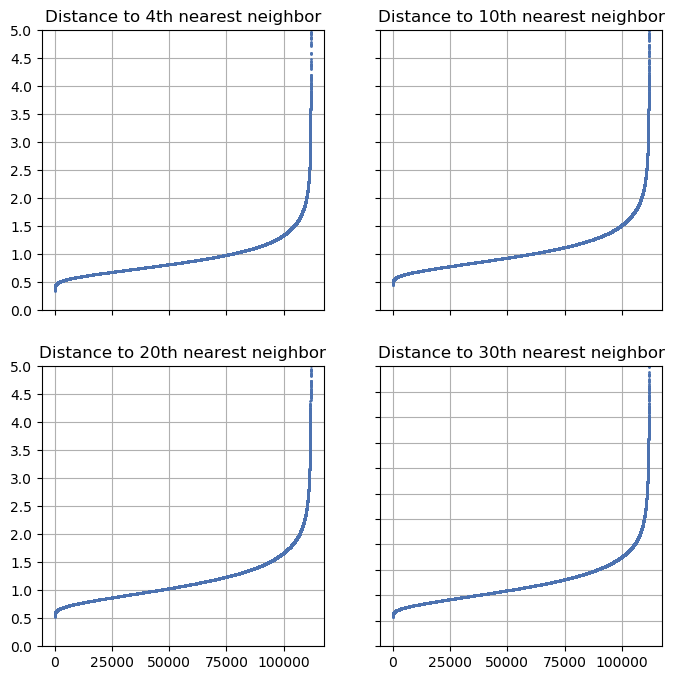

In [33]:
fig, ax = plt.subplots(2, 2, sharex=True, sharey=True, figsize=(8,8))

ax[0,0].plot(range(num_obs), db_distances4, 'b.', markersize=2)
ax[0,0].set_title('Distance to 4th nearest neighbor')
ax[0,0].grid()

ax[0,1].plot(range(num_obs), db_distances10, 'b.', markersize=2)
ax[0,1].set_title('Distance to 10th nearest neighbor')
ax[0,1].grid()

ax[1,0].plot(range(num_obs), db_distances20, 'b.', markersize=2)
ax[1,0].set_title('Distance to 20th nearest neighbor')
ax[1,0].grid()

ax[1,1].plot(range(num_obs), db_distances30, 'b.', markersize=2)
ax[1,1].set_title('Distance to 30th nearest neighbor')
ax[1,1].grid()

plt.ylim(0,5)
plt.yticks(np.arange(0,6,.5))
plt.show()

In [34]:
from sklearn.cluster import DBSCAN
min_samples = [4,10,20,30]
eps = [1.4,1.5,1.7,1.8]
db_silhouette = pd.DataFrame(columns=['eps','min_samples','n_labels','silhouette'])
for i, params in enumerate(zip(eps, min_samples)):
    db_model = DBSCAN(eps=params[0], min_samples=params[1], n_jobs=-1)
    print('Loop', i)
    %time db_model.fit(X_num)
    db_silhouette.loc[i,:] = [params[0], params[1], len(np.unique(db_model.labels_)), 
                              silhouette_score(X_num, db_model.labels_)]

Loop 0
Wall time: 50.2 s
Loop 1
Wall time: 57.8 s
Loop 2
Wall time: 1min 19s
Loop 3
Wall time: 1min 28s


In [35]:
db_silhouette

,eps,min_samples,n_labels,silhouette
0,1.4,4,76,-0.0266753
1,1.5,10,5,0.183699
2,1.7,20,3,0.208244
3,1.8,30,3,0.209135


## Choosing optimal DBSCAN models

We'll look at both the 2nd and 4th models here. Number 4 has a higher silhouette score, but 3 clusters may be too few to be useful. Note that the number of clusters shown includes a label for noise, and the actual number of clusters is one less.

In [36]:
#Fit 3 cluster model
db_model_3 = DBSCAN(eps=1.8, min_samples=30, n_jobs=-1)
%time db_model_3.fit(X_num)

#Fit 5 cluster model
db_model_5 = DBSCAN(eps=1.5, min_samples=10, n_jobs=-1)
%time db_model_5.fit(X_num)

Wall time: 1min 24s
Wall time: 58.1 s


DBSCAN(algorithm='auto', eps=1.5, leaf_size=30, metric='euclidean',
       metric_params=None, min_samples=10, n_jobs=-1, p=None)

# Modeling and Evaluation 2

Model | # clusters | Silhouette score | Training time
--- | --- | --- | ---
K-means | 5 | 0.120 | 5.25s
Mini-batch k-means | 5 | 0.125 | 518 ms
DBSCAN | 4+noise | 0.184 | 1min 2s
DBSCAN | 2+noise | 0.209 | 1min 32s

Let's look at the distribution of clusters for each model:

In [37]:
#Save a copy of the data frame for later
df2 = df.copy()
#Add labels to data frame
df['km_labels'] = km_model.labels_
df['mb_labels'] = mb_model.labels_
df['db3_labels'] = db_model_3.labels_
df['db5_labels'] = db_model_5.labels_

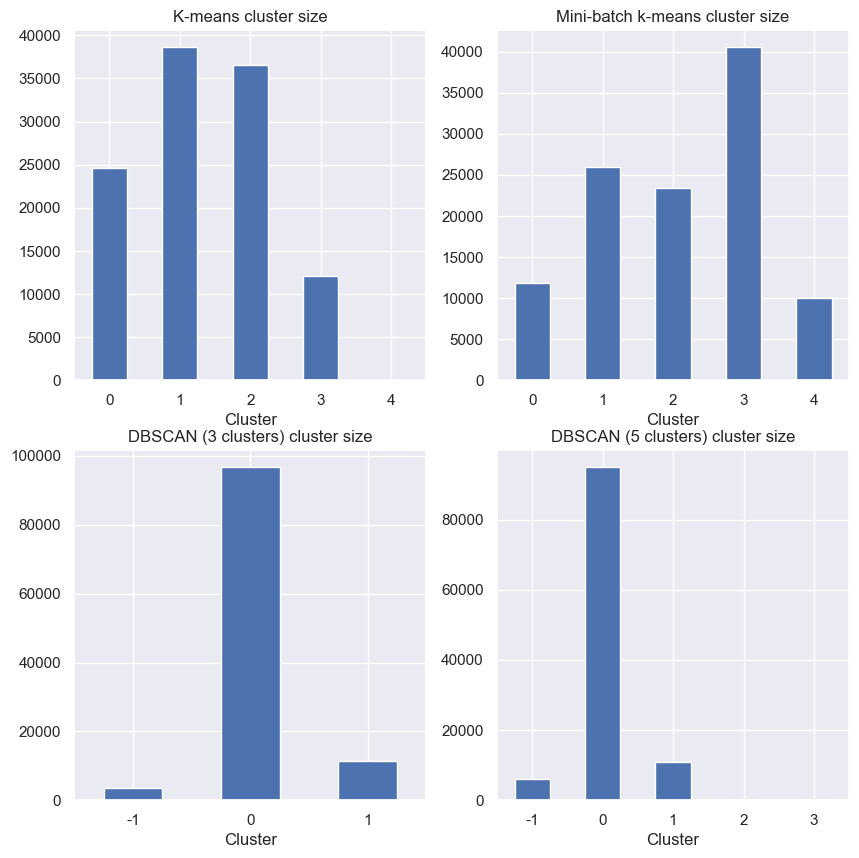

In [38]:
sns.set()

fig, ax = plt.subplots(2,2, figsize=(10,10))

#K-means
df.km_labels.value_counts().sort_index().plot(kind='bar', rot=0, ax=ax[0,0])
ax[0,0].set_title('K-means cluster size')
ax[0,0].set_xlabel('Cluster')

#Mini-batch k-means
df.mb_labels.value_counts().sort_index().plot(kind='bar', rot=0, ax=ax[0,1])
ax[0,1].set_title('Mini-batch k-means cluster size')
ax[0,1].set_xlabel('Cluster')

#DBSCAN 3 clusters
df.db3_labels.value_counts().sort_index().plot(kind='bar', rot=0, ax=ax[1,0])
ax[1,0].set_title('DBSCAN (3 clusters) cluster size')
ax[1,0].set_xlabel('Cluster')

#DBSCAN 5 clusters
df.db5_labels.value_counts().sort_index().plot(kind='bar', rot=0, ax=ax[1,1])
ax[1,1].set_title('DBSCAN (5 clusters) cluster size')
ax[1,1].set_xlabel('Cluster')

plt.show()

K-means has reasonably distributed cluster sizes except for cluster 4, which has almost no observations. With so few observations, each feature in the cluster may have a high variance, making us less confident in our cluster definition. All clusters for mini-batch k-means have 10,000+ observations, which allows us to be more confident in the feature values for each. We find that for DBSCAN, both the 3 cluster model and the 5 cluster model are telling us essentially the same thing, but the 5 cluster model has two very small clusters that may not be meaningful for us. The overwhelming majority of the observations are grouped into cluster 0, with a small amount in cluster 1 and a smaller amount labeled as noise (cluster -1). Therefore, even though it has a larger silhouette score than both k-means models, the DBSCAN clustering will probably not be very useful.

We will use the mini-batch k-means model for its meaningful cluster sizes, its higher silhouette score than standard k-means, and its fast training time.

# Modeling and Evaluation 3

In the previous lab, we measured feature importance according to coefficient size in our elastic net logisitic regression model. We will look at our most important features from that model and see if we can find differences in the clusters. But first, let's look at intercluster distance to see how separated our clusters are.

In [39]:
#Convert labels to strings for plotting
df['cluster'] = df.mb_labels.astype(str)
df.cluster = df.apply(lambda x: ' '.join(['Cluster',x['cluster']]), axis=1)
df.sort_values('cluster', inplace=True)

Wall time: 57 ms


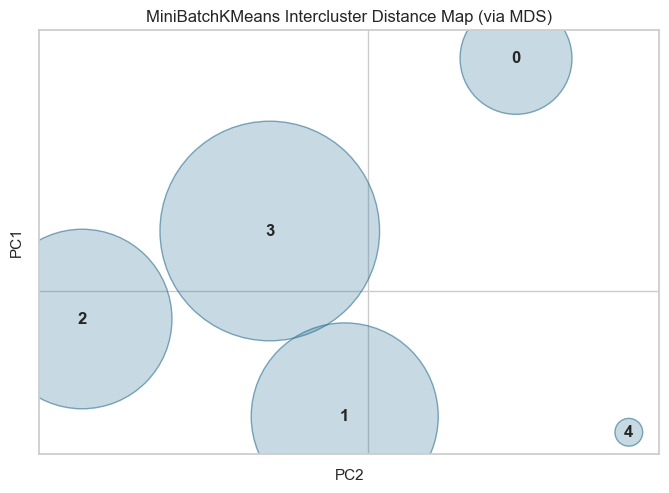

In [40]:
#Visualize intercluster distance for mini-batch k-means model
from yellowbrick.cluster import InterclusterDistance
id_visualizer = InterclusterDistance(mb_model, random_state=9001, legend=False)
%time id_visualizer.fit(X_num)
id_visualizer.show()
plt.show()

We see some overlap between cluster 3 and clusters 1 and 2, but otherwise, our clusters appear to be well-separated.

Before looking at features, let's look directly at loan status by cluster.

In [41]:
pd.crosstab(df.loan_status, df.cluster, margins=True, normalize='columns')

cluster,Cluster 0,Cluster 1,Cluster 2,Cluster 3,Cluster 4,All
loan_status,,,,,,
Current or Fully Paid,0.986215,0.988649,0.991646,0.985239,0.988026,0.987726
Late or Unpaid,0.013785,0.011351,0.008354,0.014761,0.011974,0.012274


In [72]:
px.histogram(df.sort_values('cluster'), x='loan_status', color='cluster', barnorm='fraction', 
             title='Loan status by cluster')

Cluster 2 has a much lower than average default rate. Cluster 3 is much higher than average. The others are all slightly above or below average

Now let's look at some of the most important features from our classification model.

### Interest rate

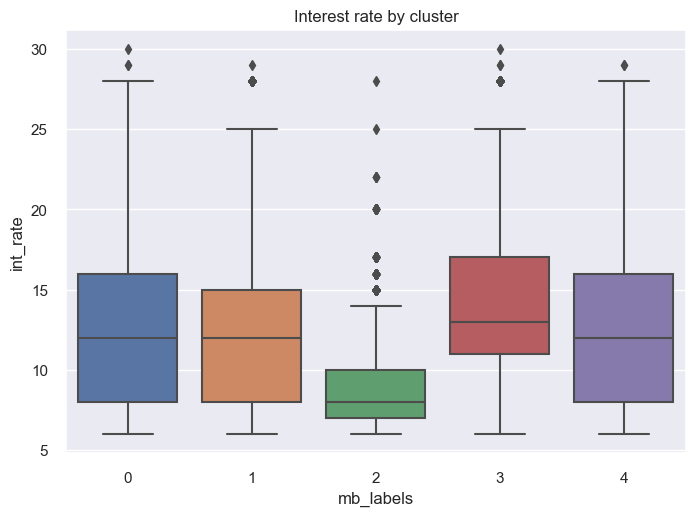

In [43]:
sns.set()
sns.boxplot(x='mb_labels', y='int_rate', data=df)
plt.title('Interest rate by cluster')
plt.show()

Interest rate was our most important feature for determining loan defaults. Cluster 2 appears to have a very low distribution of interest rates, indicating that observations within the cluster may have a lower chance of defaulting. On the other hand, cluster 3 appears to have a very high median interest rate, potentially indicating a higher risk of default.

### Loan term

In [73]:
px.histogram(df, x='cluster', color='term', barnorm='fraction', title='Term by cluster')

In [45]:
pd.crosstab(df.term, df.cluster, margins=True, normalize='columns')

cluster,Cluster 0,Cluster 1,Cluster 2,Cluster 3,Cluster 4,All
term,,,,,,
36 months,0.705304,0.541408,0.775988,0.762075,0.630313,0.696057
60 months,0.294696,0.458592,0.224012,0.237925,0.369687,0.303943


Term was our second most important feature, with 60 month loans having a greater chance of default. Clusters 1 and 4 have a much greater than average loan term, potentially indicating a higher risk of default. Clusters 2 and 3 had much lower than average loan term, and cluster 0 is about average.

### Debt-to-income ratio

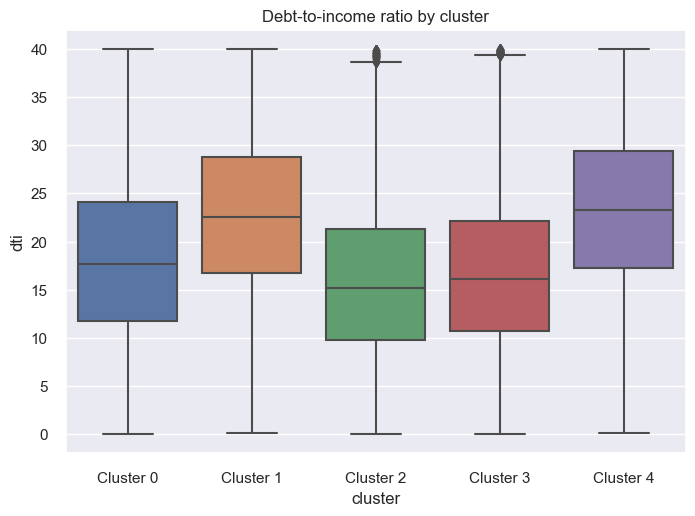

In [46]:
sns.boxplot(x='cluster', y='dti', data=df)
plt.title('Debt-to-income ratio by cluster')
plt.show()

Debt-to-income was nearly equal with term in feature importance. Counterintuitively, a higher debt-to-income ratio was associated with a lower risk of default. Clusters 1 and 4 have significantly higher debt-to-income ratios than the others, which is potentially a good sign, while clusters 2 and 3 have significantly lower ratios.

### Employment length

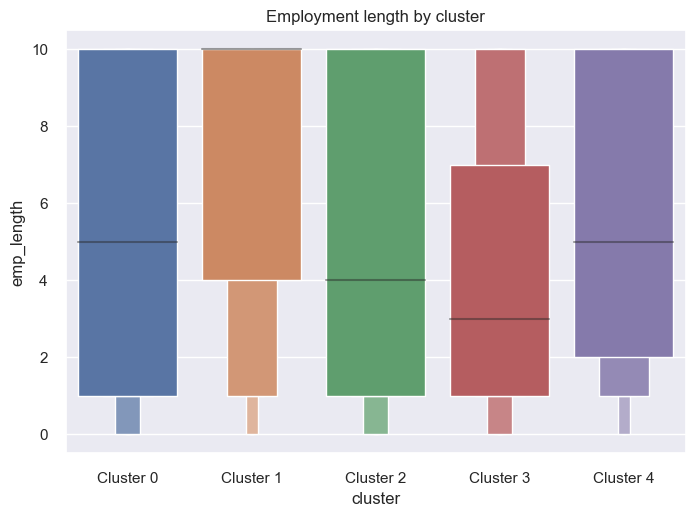

In [47]:
sns.boxenplot(x='cluster', y='emp_length', data=df)
plt.title('Employment length by cluster')
plt.show()

Also counterintuitively, a lower employment length was associated with a lower default rate. This could be a problem with the model, or it could be indicative of something like stagnation vs. upward mobility, with job hoppers having the financial freedom to look for new oppportunities with greater rewards. Nevertheless, the lowest values belong to clusters 2 and 3, while cluster 1 has a median at the maximum value of 10 years.

Lastly, let's look at some features which may not be the most important for classification but are interesting intuitively.

### Annual income

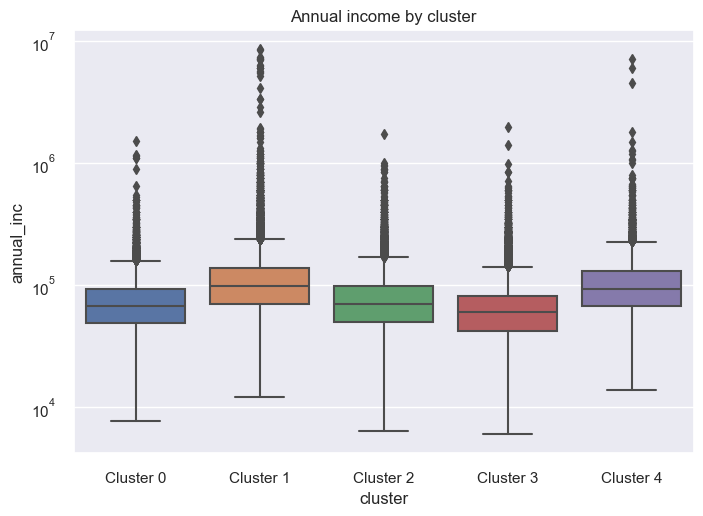

In [48]:
sns.boxplot(x='cluster', y='annual_inc', data=df)
plt.yscale('log')
plt.title('Annual income by cluster')
plt.show()

Annual income had minimal importance for classification purposes, but it is something we might want to know regardless. Clusters 1 and 4 have the highest income distributions, while cluster 3 has the lowest.

### Loan grade

In [74]:
px.histogram(df.sort_values(['cluster','letter_grade']), x='cluster', color='letter_grade', barnorm='fraction', 
            title='Loan grade by cluster')

Each loan grade value had a low importance, but loan grade is strongly correlated with interest rate. As with interest rate, cluster 2 looks by far the best here in having a lower chance of default.

### Loan purpose

In [75]:
px.histogram(df.sort_values(['cluster','purpose']), x='cluster', color='purpose', barnorm='fraction', 
            title='Loan purpose by cluster')

In [76]:
px.histogram(df.sort_values(['purpose','cluster']), x='purpose', color='cluster', barnorm='fraction', 
            title='Loan purpose by cluster')

Lastly, we'll look at what purpose members of each cluster are applying for loans for. Cluster 0 has pretty even distributions across the board compared to the average, with slightly less for moving and slightly more for house, home improvement, and small business. Cluster 1 is heavily weighted toward debt consolidation, credit cards, home improvement, and small business. Very few are applying for loans for moving or vacation. Cluster 3 appears to favor luxury expenditures like moving, vacation, and renewable energy, although medical is also a big contributor. Cluster 4 skews much more heavily toward renewable energy than other groups, although this is still a very tiny portion of their loans.

# Modeling and Evaluation 4

Here are the mean values of each feature by cluster. This gives us an idea of what the average applicant of each cluster looks like:

In [52]:
pd.pivot_table(df.drop(columns=['km_labels','mb_labels','db3_labels','db5_labels']), index='cluster').round(2)

,annual_inc,dti,earliest_cr_line,emp_length,fico_range_low,inq_last_6mths,int_rate,loan_amnt,open_acc,pub_rec,revol_bal
cluster,,,,,,,,,,,
Cluster 0,77553.80,18.18,194.35,5.21,689.57,0.53,12.61,14037.33,12.00,1.01,11341.07
Cluster 1,122134.42,22.75,248.39,6.98,702.96,0.21,12.58,24417.64,13.13,0.00,35714.95
Cluster 2,80956.13,15.88,199.92,4.98,749.89,0.32,8.49,13605.94,10.43,0.00,9813.17
Cluster 3,68243.75,16.76,151.18,4.06,685.81,0.38,13.91,11444.44,9.38,0.00,10642.00
Cluster 4,111126.34,23.31,217.51,5.52,701.56,1.39,12.89,19147.27,23.37,0.02,26341.41


In general, cluster 2 is the least risky cluster. They have a good annual income, not much debt, and great credit scores. However, they have the lowest interest rate and a low average loan amount, so the potential ROI is lower.

By contrast, cluster 3 has the highest default rate as seen earlier, and are more risky across the board. They have the lowest income and FICO score and the highest interest rate. Combined with also having the lowest loan amount, these are probably bad loans to invest in and risk losses the most while offering little gain.

Cluster 1 appears to be risky across the board, with very high DTI, earliest credit line, and revolving balance. However, they have a lower than average default rate with a very high loan amount and interest rate. This might make them potentially the best option for ROI.

In terms of marketing and customer service, these clusters offer clear differences for those with expertise in those areas to tailor their strategies towards. This also opens up the user base for better advertising experiments; advertising is very user preference centric, and we can test advertising efficacy by structuring experiments within these similar groups. Since some advertising will work on some groups and not others, we should be able to improve overall advertising efficacy this way.

# Deployment

As an investment product, we can use these clusters to display quick summaries of applicants by type to potential investors so they can look more in depth at the clusters with the best ROI and skim over those with the lowest ROI. We will be able to quickly show investors how much higher or lower than average the risk of default is and what their expected ROI might be according to the cluster.

As for marketing strategies, this model should be helpful in future planning and the execution of advertising and user preference testing. Additionally, we reduced risk in changing advertising campaigns as we can test different ads on smaller segments of the market. However, these clusters are not nearly as defined as would be our preference. More user demographic information would be useful here, as advertising is strongly dependent on the user that is targeted!

To deploy this model into production we would want to continuously add new points to given clusters, in lieu of a batch method, as we do not want users to shift groups once assigned. A batch-retraining would be easiest to implement, but could lead to some users getting pushed around groups, which would not be ideal for an advertising study. We would suggest that the model be batch-retrained at the conclusion of each ad campaign, which would be driven by the business cycle, likely quarterly.

As said above, more demographic information could be useful. Adding optional demographic questions (there is likely legal trouble with making these compulsory!) to the onboarding questionaire would be the way to do it. 

# Exceptional Work

First, we would like our in-depth comparison of different clustering methods and parameters considered for exceptional points.

Secondly, we will try to improve upon our previous two lab prediction accuracies by including the assigned cluster as an additional feature. The thinking here is that clustering the data will reveal some similarity between consumers and loans, which should help better predict the loan amount and the likelihood of default like we modeled previously. While we could do the same modeling considering each cluster individually, the clusters are not particularly distinct, and we believe the models will benefit from the collective estimation of variance in predictors, rather than the removal of dissimilar points.

In [53]:
from sklearn import metrics as mt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

df2['cluster'] = df['cluster'].copy()
df2_dummy = pd.get_dummies(df2, drop_first=True)
X_reg = df2_dummy.drop(columns='loan_amnt')
y_reg = df2_dummy['loan_amnt']

#Create regression variables and train/test splits and standardize
X_reg_train, X_reg_test, y_reg_train, y_reg_test = train_test_split(X_reg, y_reg, test_size=0.2, random_state=9001)
scaler = StandardScaler().fit(X_reg_train)
X_reg_train_scaled = scaler.transform(X_reg_train)
X_reg_test_scaled = scaler.transform(X_reg_test)

#Linear regression for loan_amnt
LReg = LinearRegression()
LReg.fit(X = X_reg_train_scaled, y = y_reg_train)

yhat = LReg.predict(X_reg_test_scaled)

print('Test mean absolute error:', mt.mean_absolute_error(y_reg_test, yhat))
print('Test R^2:', mt.r2_score(y_reg_test, yhat))


Test mean absolute error: 5909.063924383942
Test R^2: 0.43644914099181187


Previously, our MAE was 6365.57, with an R^2 of 0.3423, so slightly worse error, but slightly higher R^2. Overall, this did not make a significant difference using the cluster number as a predictor. What if we tried modeling each cluster individually? While this didn't make sense initially, the lackluster results makes it worth investigating.

In [54]:
df_cl1 = df2_dummy.loc[df2['cluster'] == 'Cluster 0']
df_cl2 = df2_dummy.loc[df2['cluster'] == 'Cluster 1']
df_cl3 = df2_dummy.loc[df2['cluster'] == 'Cluster 2']
df_cl4 = df2_dummy.loc[df2['cluster'] == 'Cluster 3']
df_cl5 = df2_dummy.loc[df2['cluster'] == 'Cluster 4']

clusters = [df_cl1, df_cl2, df_cl3, df_cl4, df_cl5]

for cluster in clusters:
    X_reg = cluster.drop(columns='loan_amnt')
    y_reg = cluster['loan_amnt']

    #Create regression variables and train/test splits and standardize
    X_reg_train, X_reg_test, y_reg_train, y_reg_test = train_test_split(X_reg, y_reg, test_size=0.2, random_state=42)
    scaler = StandardScaler().fit(X_reg_train)
    X_reg_train_scaled = scaler.transform(X_reg_train)
    X_reg_test_scaled = scaler.transform(X_reg_test)

    #Linear regression for loan_amnt
    LReg = LinearRegression()
    LReg.fit(X = X_reg_train_scaled, y = y_reg_train)

    yhat = LReg.predict(X_reg_test_scaled)
    print('Test mean absolute error:', mt.mean_absolute_error(y_reg_test, yhat))
    print('Test R^2:', mt.r2_score(y_reg_test, yhat))

Test mean absolute error: 5303.20290582577
Test R^2: 0.33286331340705555
Test mean absolute error: 7265.78131559662
Test R^2: 0.30855493395696587
Test mean absolute error: 5491.163044006498
Test R^2: 0.32141369530300057
Test mean absolute error: 4082.411099664801
Test R^2: 0.3382944761144241
Test mean absolute error: 7169.216312861028
Test R^2: 0.28081558764853287


Now we can see a difference! While this didn't work as well for cluster 2 or 5, the model outperformed the regression model we originally made for the aggregated data. If anything this shows us that there is room for improvement in our original model, and we need to investigate the variance in cluster two. And perhaps, circling back to our marketing planning, we need to market more aggressively to cluster 4, as we already have them fairly well figured out!

## ANOVA on clusters

We will use analysis of variance on the clusters to determine if certain features are really different between them.

In [55]:
from statsmodels.formula.api import ols
anova_int_rate = ols('int_rate ~ C(cluster)', data=df).fit()
anova_int_rate.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               int_rate   R-squared:                       0.172
Model:                            OLS   Adj. R-squared:                  0.172
Method:                 Least Squares   F-statistic:                     5806.
Date:                Mon, 02 Dec 2019   Prob (F-statistic):               0.00
Time:                        02:40:01   Log-Likelihood:            -3.2465e+05
No. Observations:              111863   AIC:                         6.493e+05
Df Residuals:                  111858   BIC:                         6.494e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                  12.6128      0.040    312.144      0.000      12.534      12.692
C(cluster)[T.Cluster 1]    -0.0309      0.049     -0.632      0.527      -0.127       0.065
C(cluster)[T.Cluster 2]    -4.1206      0.050    -83.068      0.000      -4.218      -4.023
C(cluster)[T.Cluster 3]     1.2933      0.046     28.145      0.000       1.203       1.383
C(cluster)[T.Cluster 4]     0.2803      0.060      4.690      0.000       0.163       0.397
==============================================================================
Omnibus:                    10481.517   Durbin-Watson:                   1.989
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            14456.477
Skew:                           0.766   Prob(JB):                         0.00
Kurtosis:                       3.867   Cond. No.                         8.06
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

We find a highly significant F-statistic for interest rate, signifying that the mean interest rate between clusters is in fact different.

In [56]:
anova_fico = ols('fico_range_low ~ C(cluster)', data=df).fit()
anova_fico.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         fico_range_low   R-squared:                       0.507
Model:                            OLS   Adj. R-squared:                  0.507
Method:                 Least Squares   F-statistic:                 2.870e+04
Date:                Mon, 02 Dec 2019   Prob (F-statistic):               0.00
Time:                        02:40:02   Log-Likelihood:            -5.1350e+05
No. Observations:              111863   AIC:                         1.027e+06
Df Residuals:                  111858   BIC:                         1.027e+06
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                 689.5709      0.219   3154.405      0.000     689.142     689.999
C(cluster)[T.Cluster 1]    13.3940      0.264     50.719      0.000      12.876      13.912
C(cluster)[T.Cluster 2]    60.3142      0.268    224.747      0.000      59.788      60.840
C(cluster)[T.Cluster 3]    -3.7647      0.249    -15.144      0.000      -4.252      -3.277
C(cluster)[T.Cluster 4]    11.9852      0.323     37.072      0.000      11.352      12.619
==============================================================================
Omnibus:                     6183.492   Durbin-Watson:                   1.999
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             7278.267
Skew:                           0.602   Prob(JB):                         0.00
Kurtosis:                       3.337   Cond. No.                         8.06
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

FICO score is also significantly different between clusters. These statistical analyses show that our clustering has been effective in producing distinct groups.